In [ ]:
#Explaining a linear regression model

In [ ]:
pip install shap

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 569 kB 4.1 MB/s 


In [ ]:
import pandas as pd
df_lin_reg = pd.read_csv('https://archive.ics.uci.edu/ml/machine-learning-databases/00374/energydata_complete.csv')
del df_lin_reg['date']
df_lin_reg.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 19735 entries, 0 to 19734
Data columns (total 28 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   Appliances   19735 non-null  int64  
 1   lights       19735 non-null  int64  
 2   T1           19735 non-null  float64
 3   RH_1         19735 non-null  float64
 4   T2           19735 non-null  float64
 5   RH_2         19735 non-null  float64
 6   T3           19735 non-null  float64
 7   RH_3         19735 non-null  float64
 8   T4           19735 non-null  float64
 9   RH_4         19735 non-null  float64
 10  T5           19735 non-null  float64
 11  RH_5         19735 non-null  float64
 12  T6           19735 non-null  float64
 13  RH_6         19735 non-null  float64
 14  T7           19735 non-null  float64
 15  RH_7         19735 non-null  float64
 16  T8           19735 non-null  float64
 17  RH_8         19735 non-null  float64
 18  T9           19735 non-null  float64
 19  RH_9

In [ ]:
df_lin_reg.columns

Index(['Appliances', 'lights', 'T1', 'RH_1', 'T2', 'RH_2', 'T3', 'RH_3', 'T4',
       'RH_4', 'T5', 'RH_5', 'T6', 'RH_6', 'T7', 'RH_7', 'T8', 'RH_8', 'T9',
       'RH_9', 'T_out', 'Press_mm_hg', 'RH_out', 'Windspeed', 'Visibility',
       'Tdewpoint', 'rv1', 'rv2'],
      dtype='object')

In [ ]:
#y is the dependent variable, that we need to predict
y = df_lin_reg.pop('Appliances')
# X is the set of input features
X = df_lin_reg

In [ ]:
!pip install interpret-core #this installation is without any dependency library

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 6.6 MB 3.4 MB/s 


Permutation explainer: 101it [00:16,  3.24it/s]


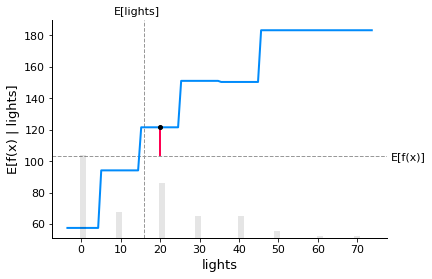

In [ ]:
# fit a GAM model to the data
import interpret.glassbox
import shap
model_ebm = interpret.glassbox.ExplainableBoostingRegressor()
model_ebm.fit(X, y)

X100 = X[:100]

# explain the GAM model with SHAP
explainer_ebm = shap.Explainer(model_ebm.predict, X100)
shap_values_ebm = explainer_ebm(X100)

# make a standard partial dependence plot with a single SHAP value overlaid
sample_ind = 20
fig,ax = shap.partial_dependence_plot(
    "lights", model_ebm.predict, X100, model_expected_value=True,
    feature_expected_value=True, show=False, ice=False,
    shap_values=shap_values_ebm[sample_ind:sample_ind+1,:]
)

In [ ]:
!pip install dash_cytoscape

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 3.6 MB 23.0 MB/s 
     |████████████████████████████████| 9.8 MB 46.9 MB/s 
     |████████████████████████████████| 357 kB 72.3 MB/s 


In [ ]:
from interpret import set_visualize_provider
from interpret.provider import InlineProvider
set_visualize_provider(InlineProvider())
from interpret import show
ebm_global = model_ebm.explain_global()
show(ebm_global)



In [ ]:
ebm_local = model_ebm.explain_local(X[:5], y[:5])
show(ebm_local)
ebm_local

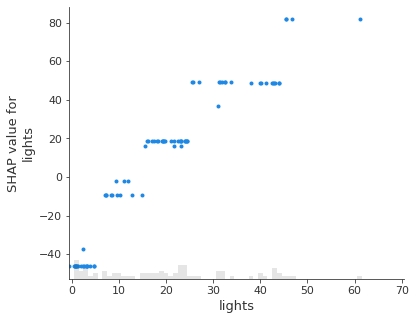

In [ ]:
shap.plots.scatter(shap_values_ebm[:,"lights"])

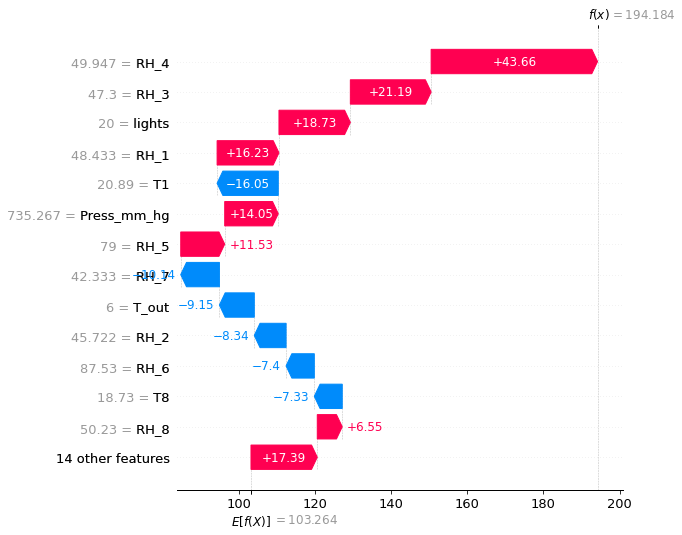

In [ ]:
# the waterfall_plot shows how we get from explainer.expected_value to model.predict(X)[sample_ind]
shap.plots.waterfall(shap_values_ebm[sample_ind], max_display=14)

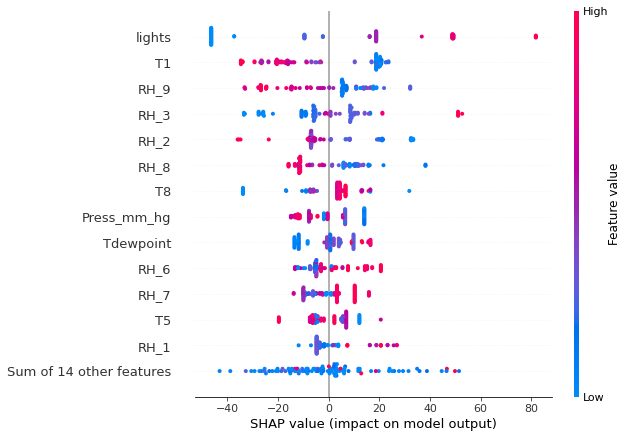

In [ ]:
# the waterfall_plot shows how we get from explainer.expected_value to model.predict(X)[sample_ind]
shap.plots.beeswarm(shap_values_ebm, max_display=14)

In [ ]:
import numpy as np
pd.DataFrame(np.round(shap_values_ebm.values,2)).head(2)


,0,1,2,3,4,5,6,7,8,9,...,17,18,19,20,21,22,23,24,25,26
0,49.18,18.75,-4.06,-5.04,-6.95,3.09,-26.46,-2.34,1.11,-5.25,...,2.6,7.02,-13.1,-1.88,-1.7,22.44,2.01,9.05,2.20,1.81
1,49.18,18.75,-4.73,-5.04,-6.95,3.09,-33.46,-2.34,-5.42,-5.25,...,2.6,7.02,-12.9,-1.88,-1.7,7.94,19.30,9.25,-0.23,-0.04


In [ ]:

pd.DataFrame(np.round(shap_values_ebm.base_values,2)).head(2)

,0
0,103.26
1,103.26


[00:32:34] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


 98%|===================| 19288/19735 [00:23<00:00]       

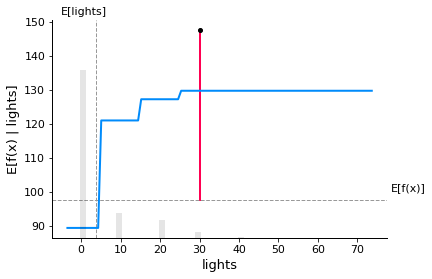

In [ ]:
# train XGBoost model
import xgboost
model_xgb = xgboost.XGBRegressor(n_estimators=100, max_depth=2).fit(X, y)

# explain the GAM model with SHAP
explainer_xgb = shap.Explainer(model_xgb, X)
shap_values_xgb = explainer_xgb(X)

# make a standard partial dependence plot with a single SHAP value overlaid
sample_ind = 18
fig,ax = shap.partial_dependence_plot(
    "lights", model_xgb.predict, X, model_expected_value=True,
    feature_expected_value=True, show=False, ice=False,
    shap_values=shap_values_xgb[sample_ind:sample_ind+1,:]
)

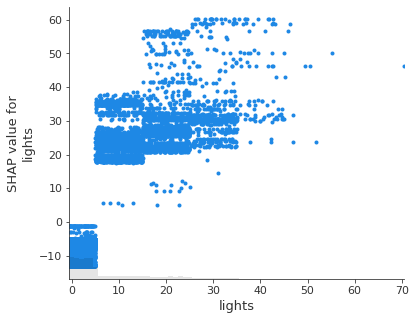

In [ ]:
shap.plots.scatter(shap_values_xgb[:,"lights"])

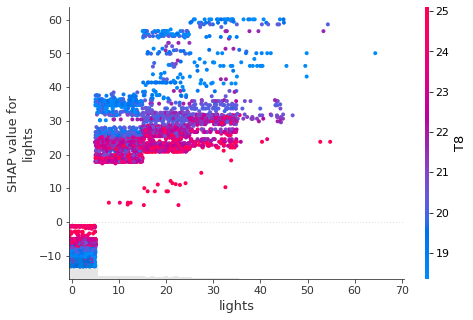

In [ ]:
shap.plots.scatter(shap_values_xgb[:,"lights"], color=shap_values_xgb)

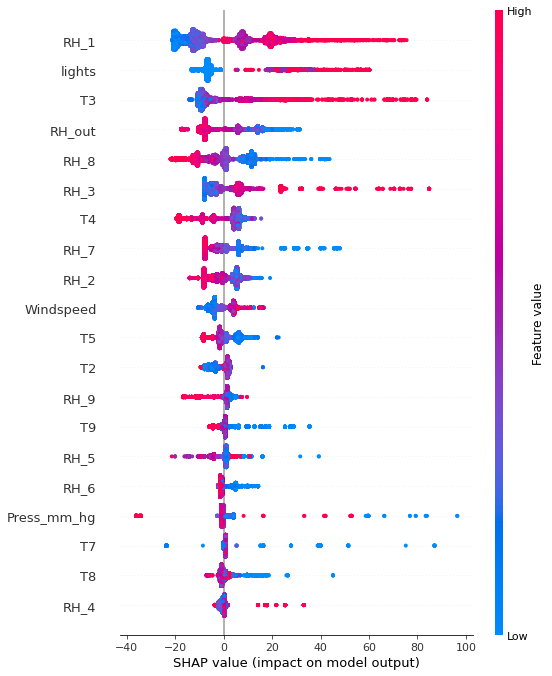

In [ ]:
shap.summary_plot(shap_values_xgb, X)

In [ ]:
import shap
from sklearn.ensemble import RandomForestRegressor
rforest = RandomForestRegressor(n_estimators=100, max_depth=3, min_samples_split=20, random_state=0)
rforest.fit(X, y)


# explain all the predictions in the test set
explainer = shap.TreeExplainer(rforest)
shap_values = explainer.shap_values(X)


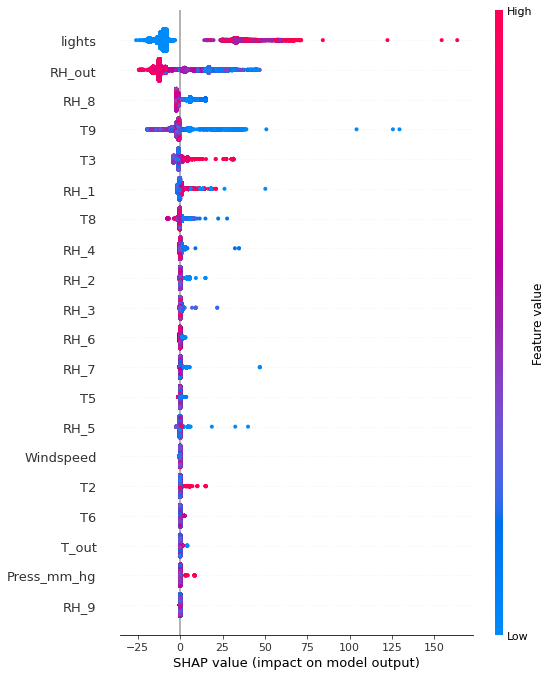

In [ ]:
shap.summary_plot(shap_values, X)

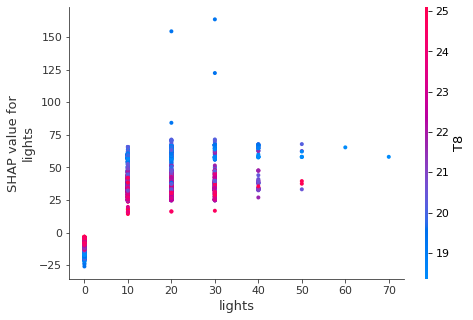

In [ ]:
shap.dependence_plot("lights", shap_values, X)

In [ ]:
# explain all the predictions in the dataset
#shap.force_plot(explainer.expected_value, shap_values, X)

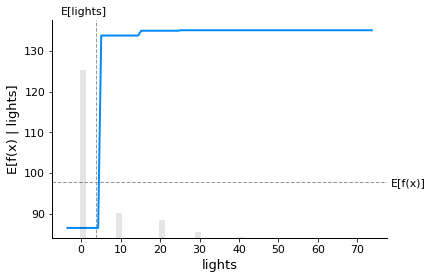

In [ ]:
shap.partial_dependence_plot(
    "lights", rforest.predict, X, ice=False,
    model_expected_value=True, feature_expected_value=True
)

In [ ]:
!pip install catboost

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 76.8 MB 1.3 MB/s 


In [ ]:
import catboost
from catboost import *
import shap
shap.initjs()

In [ ]:
model = CatBoostRegressor(iterations=100, learning_rate=0.1, random_seed=123)
model.fit(X, y, verbose=False, plot=False)

In [ ]:
explainer = shap.TreeExplainer(model)
shap_values = explainer.shap_values(X)

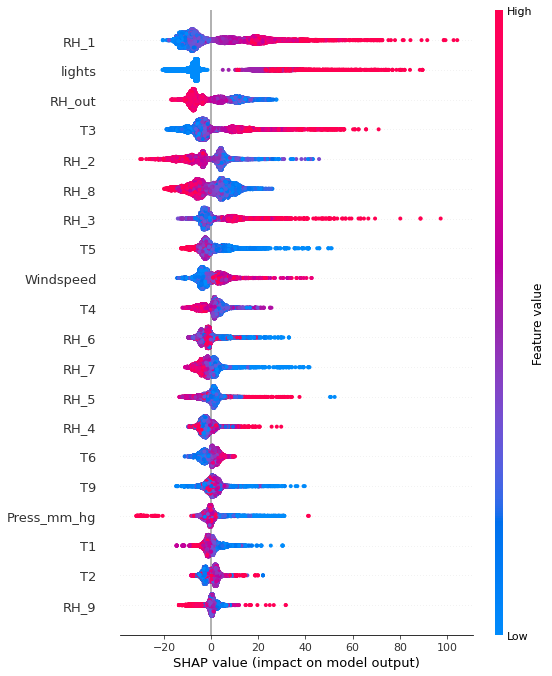

In [ ]:
# summarize the effects of all the features
shap.summary_plot(shap_values, X)

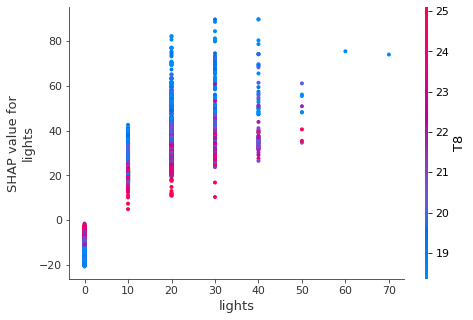

In [ ]:
# create a SHAP dependence plot to show the effect of a single feature across the whole dataset
shap.dependence_plot("lights", shap_values, X)

In [ ]:
# visualize the first prediction's explanation
shap.force_plot(explainer.expected_value, shap_values[0,:], X.iloc[0,:])


In [ ]:
!pip install interpret-core #this installation is without any dependency library

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
import pandas as pd
import numpy as np
import shap

In [ ]:
!pip install dash_cytoscape

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 3.6 MB 3.4 MB/s 
     |████████████████████████████████| 9.8 MB 36.8 MB/s 
     |████████████████████████████████| 357 kB 67.8 MB/s 


In [ ]:
# non-numeric dataset that has categorical variables

In [ ]:
df = pd.read_csv('https://raw.githubusercontent.com/pradmishra1/PublicDatasets/main/automobile.csv')

In [ ]:
df.head(3)

,Price,Make,Location,Age,Odometer,FuelType,Transmission,OwnerType,Mileage,EngineCC,PowerBhp
0,1.75,marutiwagonr,Mumbai,10,72000,CNG,Manual,First,26.6,998,58.16
1,12.50,hyundaicreta,Pune,5,41000,Diesel,Manual,First,19.67,1582,126.2
2,4.50,hondajazz,Chennai,9,46000,Petrol,Manual,First,18.2,1199,88.7


In [ ]:
df.columns

Index(['Price', 'Make', 'Location', 'Age', 'Odometer', 'FuelType',
       'Transmission', 'OwnerType', 'Mileage', 'EngineCC', 'PowerBhp'],
      dtype='object')

In [ ]:
df_t = pd.read_csv('https://raw.githubusercontent.com/pradmishra1/PublicDatasets/main/Automobile_transformed.csv')

In [ ]:
del df_t['Unnamed: 0']
df_t.head(3)

,Price,Age,Odometer,mileage,engineCC,powerBhp,Location_Bangalore,Location_Chennai,Location_Coimbatore,Location_Delhi,...,Location_Mumbai,Location_Pune,FuelType_Diesel,FuelType_Electric,FuelType_LPG,FuelType_Petrol,Transmission_Manual,OwnerType_Fourth +ACY- Above,OwnerType_Second,OwnerType_Third
0,1.75,10,72000,26.60,998.0,58.16,0,0,0,0,...,1,0,0,0,0,0,1,0,0,0
1,12.50,5,41000,19.67,1582.0,126.20,0,0,0,0,...,0,1,1,0,0,0,1,0,0,0
2,4.50,9,46000,18.20,1199.0,88.70,0,1,0,0,...,0,0,0,0,0,1,1,0,0,0


In [ ]:
df_t.columns

Index(['Price', 'Age', 'Odometer', 'mileage', 'engineCC', 'powerBhp',
       'Location_Bangalore', 'Location_Chennai', 'Location_Coimbatore',
       'Location_Delhi', 'Location_Hyderabad', 'Location_Jaipur',
       'Location_Kochi', 'Location_Kolkata', 'Location_Mumbai',
       'Location_Pune', 'FuelType_Diesel', 'FuelType_Electric', 'FuelType_LPG',
       'FuelType_Petrol', 'Transmission_Manual',
       'OwnerType_Fourth +ACY- Above', 'OwnerType_Second', 'OwnerType_Third'],
      dtype='object')

In [ ]:
#y is the dependent variable, that we need to predict
y = df_t.pop('Price')
# X is the set of input features
X = df_t

In [ ]:
from interpret import set_visualize_provider
from interpret.provider import InlineProvider
set_visualize_provider(InlineProvider())

import pandas as pd
from sklearn.model_selection import train_test_split

from interpret.glassbox import ExplainableBoostingClassifier
from interpret import show

import shap
import sklearn

In [ ]:
# fit a GAM model to the data
import interpret.glassbox
import shap
model_ebm = interpret.glassbox.ExplainableBoostingRegressor()
model_ebm.fit(X, y)

X100 = X[:100]

# explain the GAM model with SHAP
explainer_ebm = shap.Explainer(model_ebm.predict, X100)
shap_values_ebm = explainer_ebm(X100)

Permutation explainer: 101it [01:03,  1.43it/s]


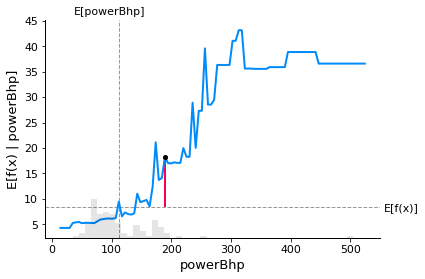

In [ ]:
# make a standard partial dependence plot with a single SHAP value overlaid
sample_ind = 20
fig,ax = shap.partial_dependence_plot(
    "powerBhp", model_ebm.predict, X100, model_expected_value=True,
    feature_expected_value=True, show=False, ice=False,
    shap_values=shap_values_ebm[sample_ind:sample_ind+1,:]
)

In [ ]:
from interpret import set_visualize_provider
from interpret.provider import InlineProvider
set_visualize_provider(InlineProvider())
from interpret import show
ebm_global = model_ebm.explain_global()
show(ebm_global)

In [ ]:
ebm_local = model_ebm.explain_local(X[:5], y[:5])
show(ebm_local)

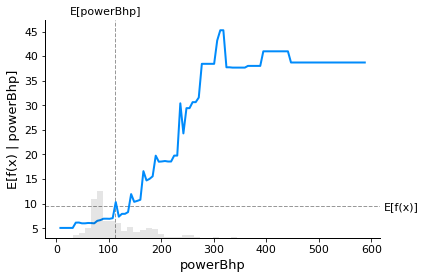

In [ ]:
shap.partial_dependence_plot(
    "powerBhp", model_ebm.predict, X, ice=False,
    model_expected_value=True, feature_expected_value=True
)

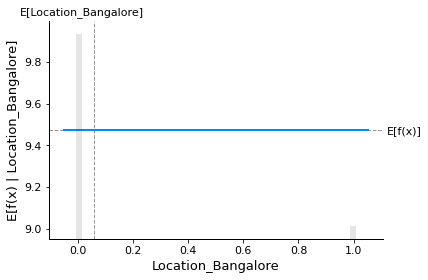

In [ ]:
shap.partial_dependence_plot(
    "Location_Bangalore", model_ebm.predict, X, ice=False,
    model_expected_value=True, feature_expected_value=True
)

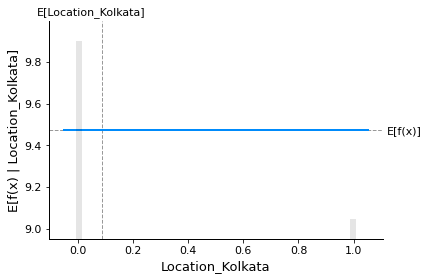

In [ ]:
shap.partial_dependence_plot(
    "Location_Kolkata", model_ebm.predict, X, ice=False,
    model_expected_value=True, feature_expected_value=True
)

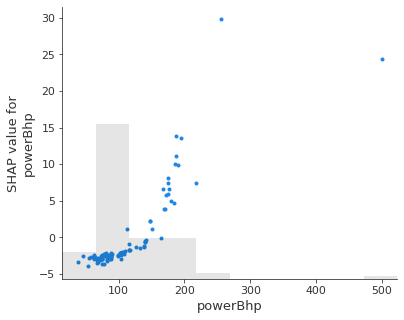

In [ ]:
shap.plots.scatter(shap_values_ebm[:,"powerBhp"])

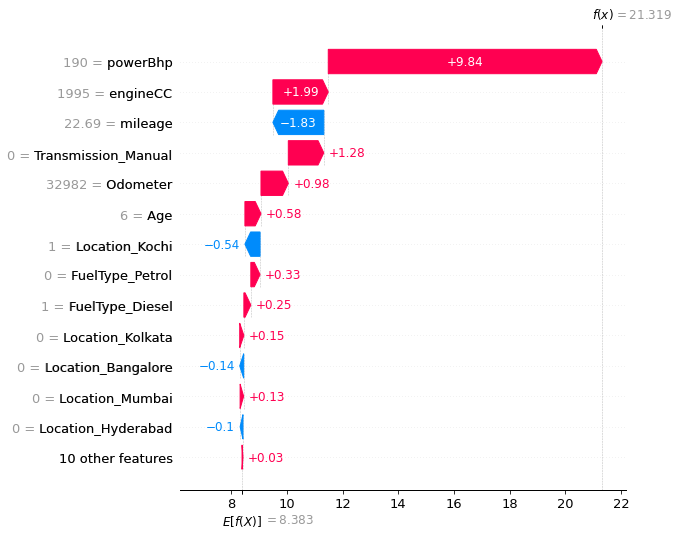

In [ ]:
# the waterfall_plot shows how we get from explainer.expected_value to model.predict(X)[sample_ind]
shap.plots.waterfall(shap_values_ebm[sample_ind], max_display=14)

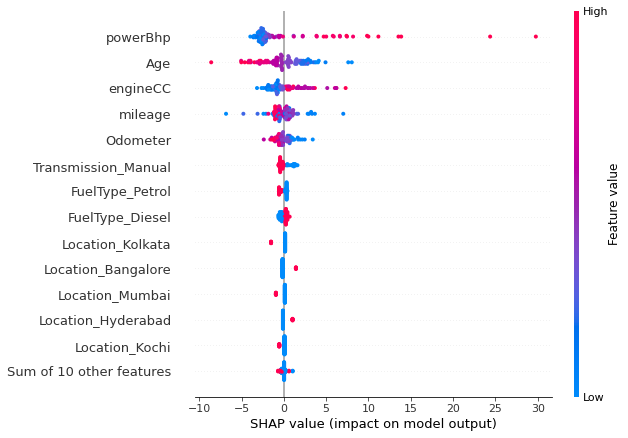

In [ ]:
# the waterfall_plot shows how we get from explainer.expected_value to model.predict(X)[sample_ind]
shap.plots.beeswarm(shap_values_ebm, max_display=14)

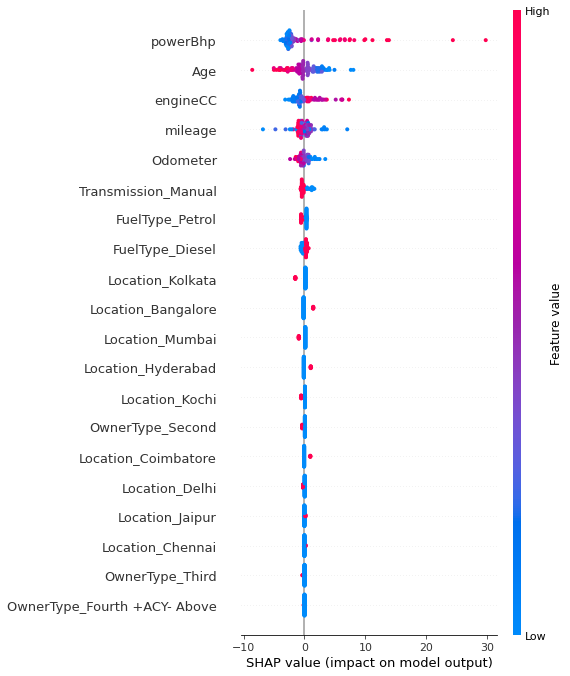

In [ ]:
# explain all the predictions in the dataset
shap.summary_plot(shap_values_ebm, X100)

In [ ]:
import numpy as np
pd.DataFrame(np.round(shap_values_ebm.values,2)).head(2)


,0,1,2,3,4,5,6,7,8,9,...,13,14,15,16,17,18,19,20,21,22
0,-2.12,-0.10,-0.73,-1.00,-2.68,-0.14,-0.01,-0.06,0.04,-0.1,...,-0.93,0.0,-0.24,0.0,-0.0,0.19,-0.12,0.0,0.07,0.01
1,1.57,0.85,0.64,-0.33,-1.34,-0.14,-0.01,-0.06,0.04,-0.1,...,0.13,-0.0,0.27,0.0,-0.0,0.32,-0.44,0.0,0.07,0.01


In [ ]:

pd.DataFrame(np.round(shap_values_ebm.base_values,2)).head(2)

,0
0,8.38
1,8.38


[01:18:22] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


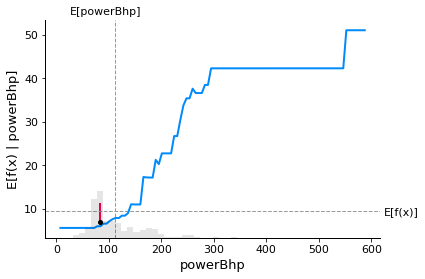

In [ ]:
# train XGBoost model
import xgboost
model_xgb = xgboost.XGBRegressor(n_estimators=100, max_depth=2).fit(X, y)

# explain the GAM model with SHAP
explainer_xgb = shap.Explainer(model_xgb, X)
shap_values_xgb = explainer_xgb(X)

# make a standard partial dependence plot with a single SHAP value overlaid
sample_ind = 18
fig,ax = shap.partial_dependence_plot(
    "powerBhp", model_xgb.predict, X, model_expected_value=True,
    feature_expected_value=True, show=False, ice=False,
    shap_values=shap_values_xgb[sample_ind:sample_ind+1,:]
)

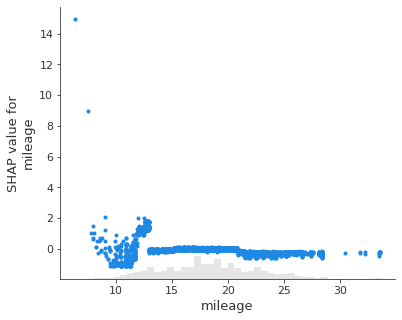

In [ ]:
shap.plots.scatter(shap_values_xgb[:,"mileage"])

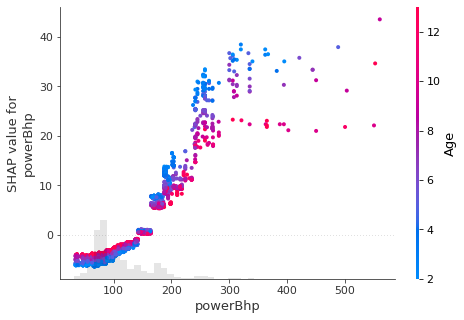

In [ ]:
shap.plots.scatter(shap_values_xgb[:,"powerBhp"], color=shap_values_xgb)

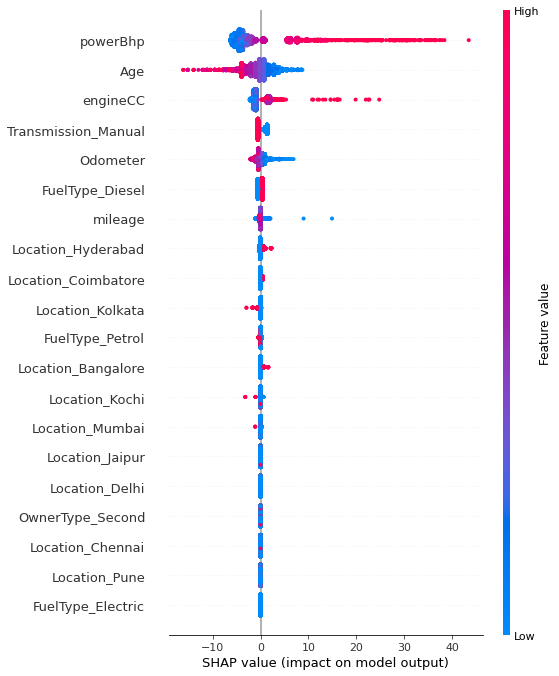

In [ ]:
shap.summary_plot(shap_values_xgb, X)

In [ ]:
import shap
from sklearn.ensemble import RandomForestRegressor
rforest = RandomForestRegressor(n_estimators=100, max_depth=3, min_samples_split=20, random_state=0)
rforest.fit(X, y)


# explain all the predictions in the test set
explainer = shap.TreeExplainer(rforest)
shap_values = explainer.shap_values(X)


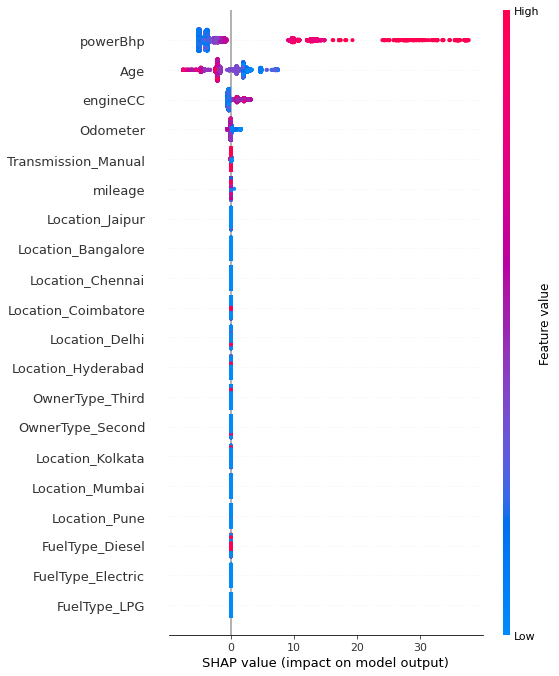

In [ ]:
  shap.summary_plot(shap_values, X)

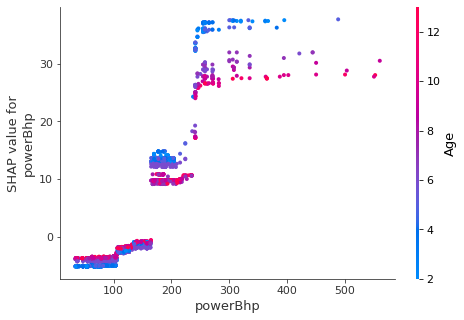

In [ ]:
shap.dependence_plot("powerBhp", shap_values, X)

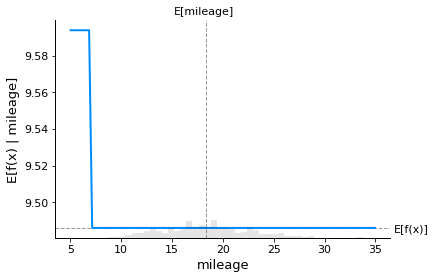

In [ ]:
shap.partial_dependence_plot(
    "mileage", rforest.predict, X, ice=False,
    model_expected_value=True, feature_expected_value=True
)

In [ ]:
!pip install catboost

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 76.8 MB 19 kB/s 


In [ ]:
import catboost
from catboost import *
import shap

In [ ]:
model = CatBoostRegressor(iterations=100, learning_rate=0.1, random_seed=123)
model.fit(X, y, verbose=False, plot=False)
explainer = shap.TreeExplainer(model)
shap_values = explainer.shap_values(X)

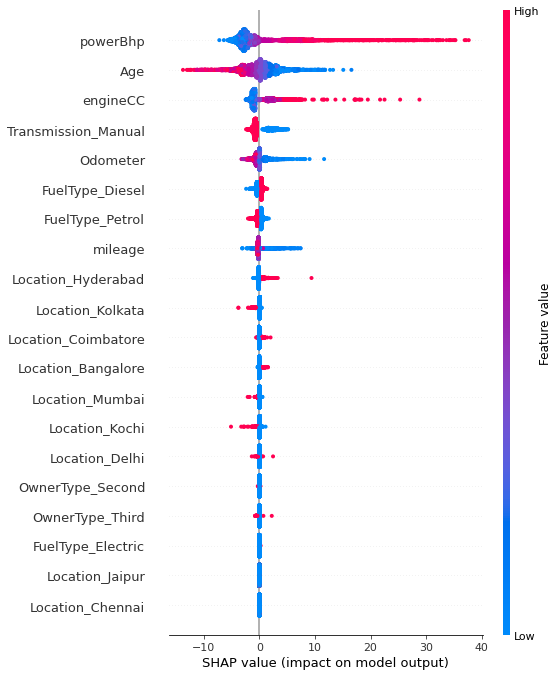

In [ ]:
# summarize the effects of all the features
shap.summary_plot(shap_values, X)

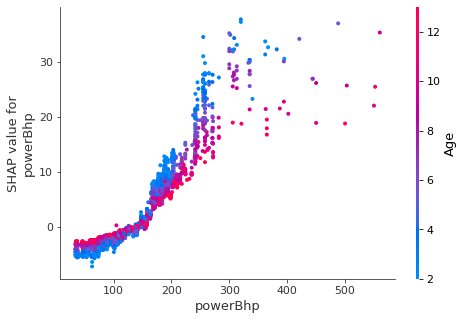

In [ ]:
# create a SHAP dependence plot to show the effect of a single feature across the whole dataset
shap.dependence_plot("powerBhp", shap_values, X)

In [ ]:
!pip install lime

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 275 kB 3.2 MB/s 
  Created wheel for lime: filename=lime-0.2.0.1-py3-none-any.whl size=283857 sha256=72110139268031bf7b384195e61a2749cb02678c5e951ee28dc6bbfbf616a9e5
  Stored in directory: /root/.cache/pip/wheels/ca/cb/e5/ac701e12d365a08917bf4c6171c0961bc880a8181359c66aa7
Successfully built lime


In [ ]:
import lime
import lime.lime_tabular

explainer = lime.lime_tabular.LimeTabularExplainer(np.array(X),
                                                   mode='regression',
                                                  feature_names=X.columns,
                                                  class_names=['price'],
                                                  verbose=True)

In [ ]:
explainer.feature_selection

'auto'

In [ ]:
# asking for explanation for LIME model
i = 60
exp = explainer.explain_instance(np.array(X)[i],
                                 model.predict, 
                                 num_features=14
                                )


model.predict(X)[60]

X[60:61]

Intercept 2.412781377314505
Prediction_local [26.44019841]
Right: 18.91681746836109


,Age,Odometer,mileage,engineCC,powerBhp,Location_Bangalore,Location_Chennai,Location_Coimbatore,Location_Delhi,Location_Hyderabad,...,Location_Mumbai,Location_Pune,FuelType_Diesel,FuelType_Electric,FuelType_LPG,FuelType_Petrol,Transmission_Manual,OwnerType_Fourth +ACY- Above,OwnerType_Second,OwnerType_Third
60,3,22000,13.68,2393.0,147.8,0,0,0,0,0,...,1,0,1,0,0,0,1,0,0,0


In [ ]:
exp.show_in_notebook(show_table=True)

In [ ]:
exp.as_list()

[('powerBhp > 138.10', 11.685972887206468),
 ('Age <= 4.00', 5.069171125183003),
 ('engineCC > 1984.00', 3.2307037317922287),
 ('0.00 < Transmission_Manual <= 1.00', -2.175314285519644),
 ('Odometer <= 34000.00', 2.0903883419638976),
 ('OwnerType_Fourth +ACY- Above <= 0.00', 1.99286243362804),
 ('Location_Hyderabad <= 0.00', -1.4395857770864107),
 ('mileage <= 15.30', 1.016369130009493),
 ('0.00 < FuelType_Diesel <= 1.00', 0.8477072936504322),
 ('Location_Kolkata <= 0.00', 0.6908993069146472),
 ('FuelType_Petrol <= 0.00', 0.654629068871846),
 ('Location_Bangalore <= 0.00', -0.47395963805113284),
 ('FuelType_Electric <= 0.00', 0.4285429019735695),
 ('Location_Delhi <= 0.00', 0.40903051200940277)]

In [ ]:
pip install eli5

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 216 kB 3.2 MB/s 
     |████████████████████████████████| 133 kB 60.8 MB/s 
  Created wheel for eli5: filename=eli5-0.13.0-py2.py3-none-any.whl size=107748 sha256=033f64eeb0789e0012ec81239808e3f46030932867167bbcd8ddf34c2562ff9d
  Stored in directory: /root/.cache/pip/wheels/cc/3c/96/3ead31a8e6c20fc0f1a707fde2e05d49a80b1b4b30096573be
Successfully built eli5
  Attempting uninstall: jinja2
    Found existing installation: Jinja2 2.11.3
    Uninstalling Jinja2-2.11.3:
      Successfully uninstalled Jinja2-2.11.3
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
flask 1.1.4 requires Jinja2<3.0,>=2.10.1, but you have jinja2 3.1.2 which is incompatible.


In [ ]:
import eli5

In [ ]:
eli5.show_weights(model,
                 feature_names=list(X.columns))

Weight,Feature
0.4385,powerBhp
0.2572,Age
0.0976,engineCC
0.0556,Odometer
0.0489,mileage
0.0396,Transmission_Manual
0.0167,FuelType_Petrol
0.0165,FuelType_Diesel
0.0104,Location_Hyderabad
0.0043,Location_Coimbatore


In [ ]:
eli5.explain_weights(model, feature_names=list(X.columns))

Weight,Feature
0.4385,powerBhp
0.2572,Age
0.0976,engineCC
0.0556,Odometer
0.0489,mileage
0.0396,Transmission_Manual
0.0167,FuelType_Petrol
0.0165,FuelType_Diesel
0.0104,Location_Hyderabad
0.0043,Location_Coimbatore


In [ ]:
eli5.explain_prediction(model,X.iloc[60])

Explanation(estimator='<catboost.core.CatBoostRegressor object at 0x7fce887004d0>', description=None, error='estimator <catboost.core.CatBoostRegressor object at 0x7fce887004d0> is not supported', method=None, is_regression=False, targets=None, feature_importances=None, decision_tree=None, highlight_spaces=None, transition_features=None, image=None)

In [ ]:
from eli5.sklearn import PermutationImportance

# a simple linear model initialized
model = sklearn.tree.DecisionTreeRegressor()

# linear regression model trained
model.fit(X, y)

DecisionTreeRegressor()

In [ ]:
perm = PermutationImportance(model)
perm.fit(X, y)
eli5.show_weights(perm,feature_names=list(X.columns))

Weight,Feature
0.6743 ± 0.0242,powerBhp
0.2880 ± 0.0230,Age
0.1188 ± 0.0068,engineCC
0.0577 ± 0.0028,Transmission_Manual
0.0457 ± 0.0048,Odometer
0.0354 ± 0.0053,mileage
0.0134 ± 0.0018,Location_Hyderabad
0.0082 ± 0.0022,FuelType_Petrol
0.0066 ± 0.0013,FuelType_Diesel
0.0042 ± 0.0010,Location_Kochi


In [ ]:
### Explaining a linear logistic regression model

In [119]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
from sklearn import tree, metrics, model_selection, preprocessing
from sklearn.metrics import confusion_matrix, classification_report

df_train = pd.read_csv('https://raw.githubusercontent.com/pradmishra1/PublicDatasets/main/ChurnData_test.csv')

In [120]:
from sklearn.preprocessing import LabelEncoder

tras = LabelEncoder()
df_train['area_code_tr'] = tras.fit_transform(df_train['area_code'])
df_train.columns
del df_train['area_code']
df_train.columns
df_train['target_churn_dum'] = pd.get_dummies(df_train.churn,prefix='churn',drop_first=True)
df_train.columns
del df_train['international_plan']
del df_train['voice_mail_plan']
del df_train['churn']
df_train.info()
del df_train['Unnamed: 0']
df_train.columns

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1667 entries, 0 to 1666
Data columns (total 19 columns):
 #   Column                         Non-Null Count  Dtype  
---  ------                         --------------  -----  
 0   Unnamed: 0                     1667 non-null   int64  
 1   state                          1667 non-null   object 
 2   account_length                 1667 non-null   int64  
 3   number_vmail_messages          1667 non-null   int64  
 4   total_day_minutes              1667 non-null   float64
 5   total_day_calls                1667 non-null   int64  
 6   total_day_charge               1667 non-null   float64
 7   total_eve_minutes              1667 non-null   float64
 8   total_eve_calls                1667 non-null   int64  
 9   total_eve_charge               1667 non-null   float64
 10  total_night_minutes            1667 non-null   float64
 11  total_night_calls              1667 non-null   int64  
 12  total_night_charge             1667 non-null   f

Index(['state', 'account_length', 'number_vmail_messages', 'total_day_minutes',
       'total_day_calls', 'total_day_charge', 'total_eve_minutes',
       'total_eve_calls', 'total_eve_charge', 'total_night_minutes',
       'total_night_calls', 'total_night_charge', 'total_intl_minutes',
       'total_intl_calls', 'total_intl_charge',
       'number_customer_service_calls', 'area_code_tr', 'target_churn_dum'],
      dtype='object')

In [121]:
df_train.columns

Index(['state', 'account_length', 'number_vmail_messages', 'total_day_minutes',
       'total_day_calls', 'total_day_charge', 'total_eve_minutes',
       'total_eve_calls', 'total_eve_charge', 'total_night_minutes',
       'total_night_calls', 'total_night_charge', 'total_intl_minutes',
       'total_intl_calls', 'total_intl_charge',
       'number_customer_service_calls', 'area_code_tr', 'target_churn_dum'],
      dtype='object')

In [122]:
from sklearn.model_selection import train_test_split

X = df_train[['account_length', 'number_vmail_messages', 'total_day_minutes',
       'total_day_calls', 'total_day_charge', 'total_eve_minutes',
       'total_eve_calls', 'total_eve_charge', 'total_night_minutes',
       'total_night_calls', 'total_night_charge', 'total_intl_minutes',
       'total_intl_calls', 'total_intl_charge',
       'number_customer_service_calls', 'area_code_tr']]
Y = df_train['target_churn_dum']

In [ ]:
import pandas as pd
from sklearn.model_selection import train_test_split

from interpret.glassbox import ExplainableBoostingClassifier
from interpret import show

In [ ]:
xtrain,xtest,ytrain,ytest=train_test_split(X,Y,test_size=0.20,stratify=Y)
ebm = ExplainableBoostingClassifier(random_state=12)
ebm.fit(xtrain, ytrain)

ebm_global = ebm.explain_global()
show(ebm_global)

ebm_local = ebm.explain_local(xtest[:5], ytest[:5])
show(ebm_local)

print("training accuracy:", ebm.score(xtrain,ytrain)) #training accuracy

print("test accuracy:",ebm.score(xtest,ytest)) # test accuracy

training accuracy: 0.9392348087021756
test accuracy: 0.9221556886227545


In [ ]:
show(ebm_global)

In [ ]:
from interpret import set_visualize_provider
from interpret.provider import InlineProvider
set_visualize_provider(InlineProvider())
from interpret import show

In [ ]:
X100 = X[:100]

# explain the GAM model with SHAP
explainer_ebm = shap.Explainer(ebm.predict, X100)
shap_values_ebm = explainer_ebm(X100)


In [ ]:
ebm_global = ebm.explain_global()
show(ebm_global)

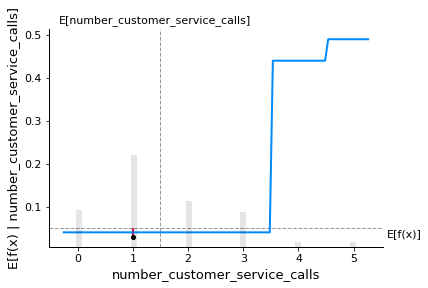

In [ ]:
# make a standard partial dependence plot with a single SHAP value overlaid
sample_ind = 20
fig,ax = shap.partial_dependence_plot(
    "number_customer_service_calls", ebm.predict, X100, model_expected_value=True,
    feature_expected_value=True, show=False, ice=False,
    shap_values=shap_values_ebm[sample_ind:sample_ind+1,:]
)

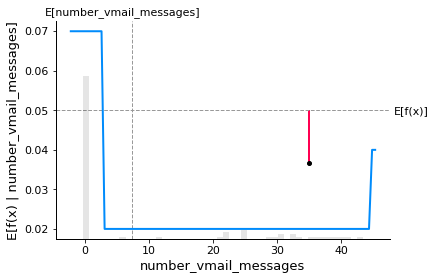

In [ ]:
# make a standard partial dependence plot with a single SHAP value overlaid
sample_ind = 20
fig,ax = shap.partial_dependence_plot(
    "number_vmail_messages", ebm.predict, X100, model_expected_value=True,
    feature_expected_value=True, show=False, ice=False,
    shap_values=shap_values_ebm[sample_ind:sample_ind+1,:]
)

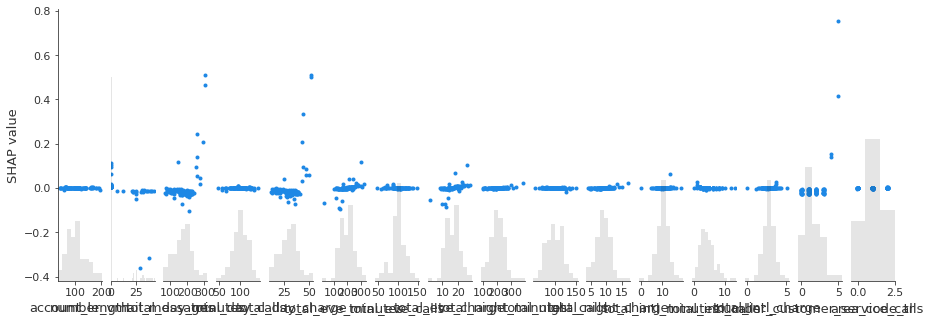

In [ ]:
shap.plots.scatter(shap_values_ebm)

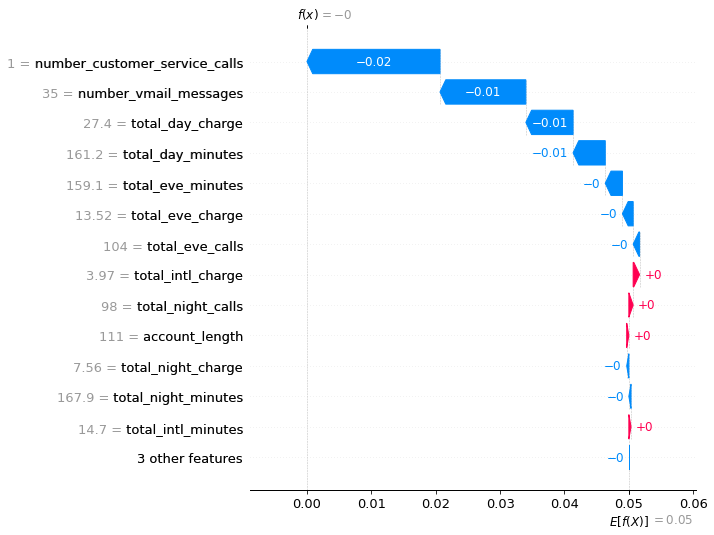

In [ ]:
# the waterfall_plot shows how we get from explainer.expected_value to model.predict(X)[sample_ind]
shap.plots.waterfall(shap_values_ebm[sample_ind], max_display=14)

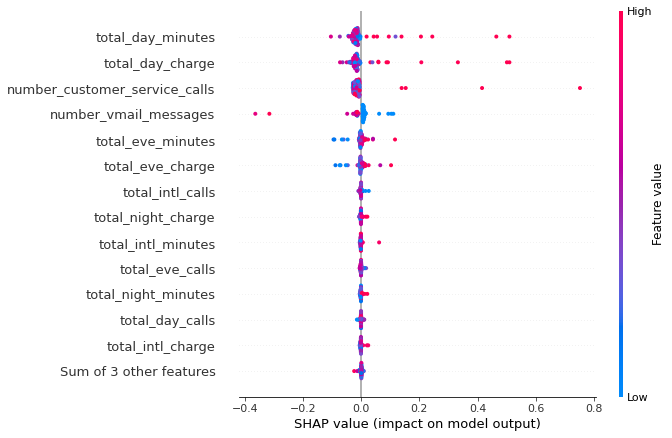

In [ ]:
# the waterfall_plot shows how we get from explainer.expected_value to model.predict(X)[sample_ind]
shap.plots.beeswarm(shap_values_ebm, max_display=14)

In [ ]:
import numpy as np
pd.DataFrame(np.round(shap_values_ebm.values,2)).head(2)


,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15
0,0.0,0.01,-0.02,-0.0,-0.02,0.0,0.0,0.01,0.0,0.0,-0.0,-0.0,-0.0,-0.0,-0.02,0.0
1,0.0,0.01,-0.03,-0.0,-0.03,0.0,-0.0,0.01,-0.0,0.0,-0.0,-0.0,-0.0,-0.0,-0.01,0.0


In [136]:
# train XGBoost model
import xgboost
model = xgboost.XGBClassifier(n_estimators=100, max_depth=2).fit(X, Y)

# compute SHAP values
explainer = shap.Explainer(model, X)
shap_values = explainer(X)


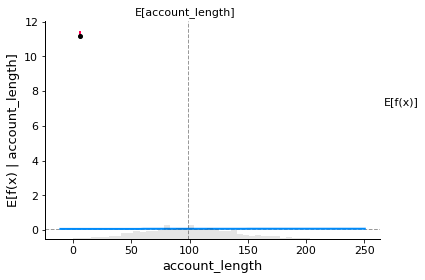

In [137]:
# make a standard partial dependence plot with a single SHAP value overlaid
sample_ind = 18
fig,ax = shap.partial_dependence_plot(
    "account_length", model.predict, X, model_expected_value=True,
    feature_expected_value=True, show=False, ice=False,
    shap_values=shap_values_xgb[sample_ind:sample_ind+1,:]
)

In [138]:
import numpy as np
pd.DataFrame(np.round(shap_values.values,2)).head(2)


,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15
0,-0.0,0.18,0.04,-0.16,0.0,-0.05,0.15,0.0,0.15,0.04,0.0,-0.14,-0.12,0.0,0.27,0.0
1,0.0,0.26,-0.29,-0.03,0.0,0.21,-0.11,0.0,-0.22,0.04,0.0,-0.08,-0.15,0.0,-0.20,0.0


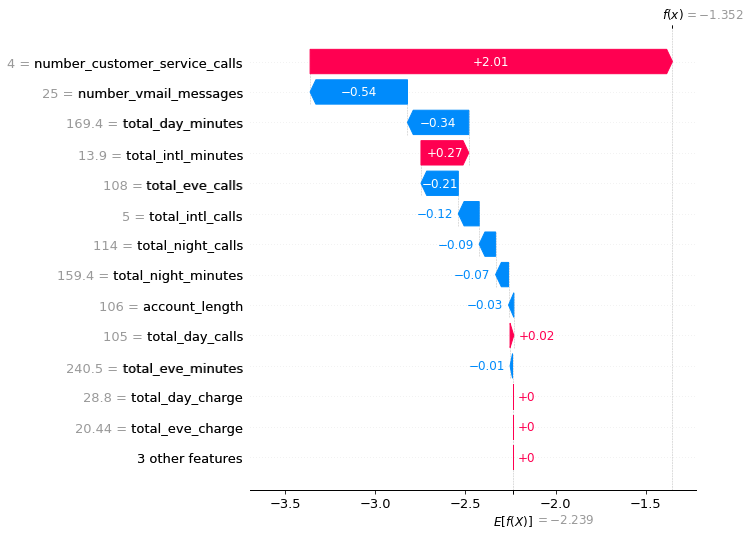

In [139]:
# the waterfall_plot shows how we get from explainer.expected_value to model.predict(X)[sample_ind]
shap.plots.waterfall(shap_values[sample_ind], max_display=14)

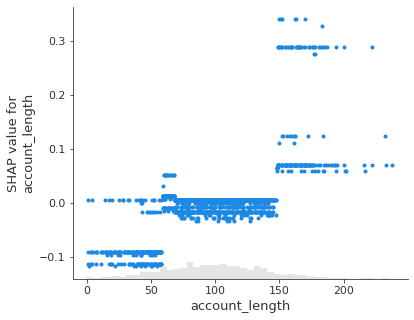

In [140]:
# the waterfall_plot shows how we get from explainer.expected_value to model.predict(X)[sample_ind]
shap.plots.scatter(shap_values[:,"account_length"])

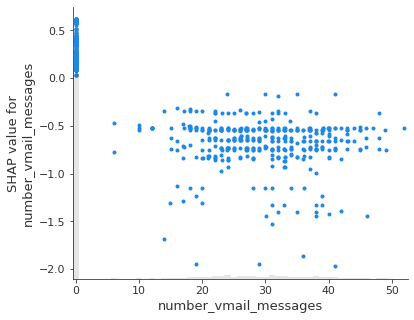

In [141]:
# the waterfall_plot shows how we get from explainer.expected_value to model.predict(X)[sample_ind]
shap.plots.scatter(shap_values[:,"number_vmail_messages"])

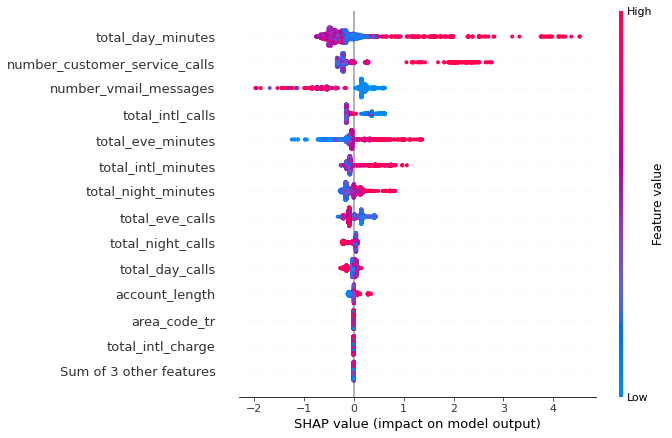

In [142]:
# the waterfall_plot shows how we get from explainer.expected_value to model.predict(X)[sample_ind]
shap.plots.beeswarm(shap_values, max_display=14)

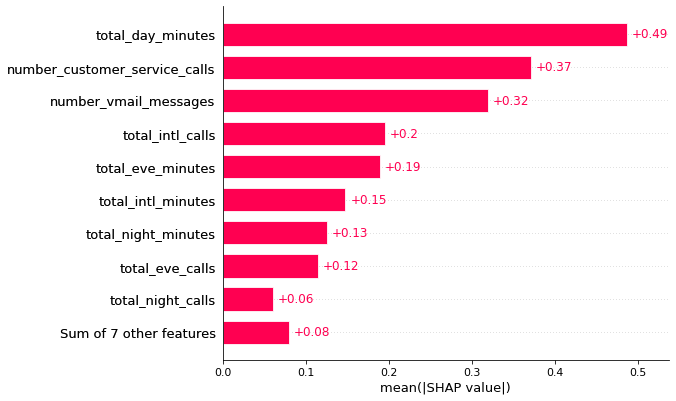

In [145]:
shap.plots.bar(shap_values)

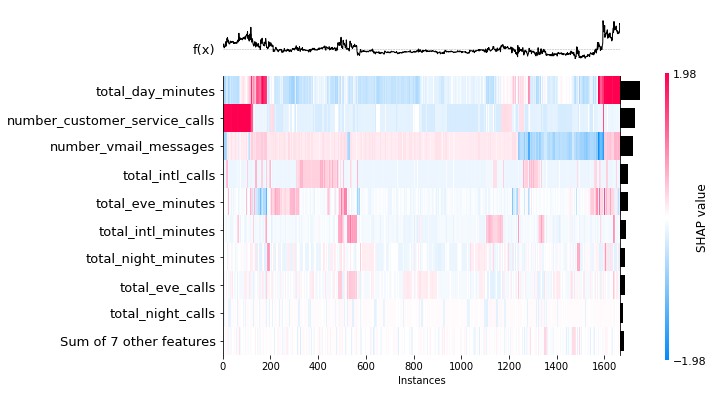

In [146]:
shap.plots.heatmap(shap_values[:5000])

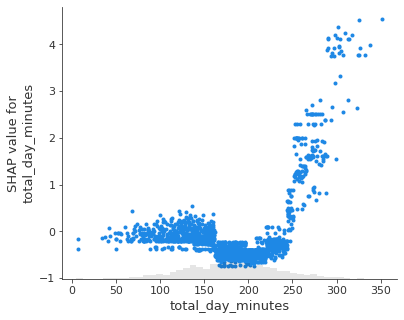

In [147]:
shap.plots.scatter(shap_values[:,"total_day_minutes"])

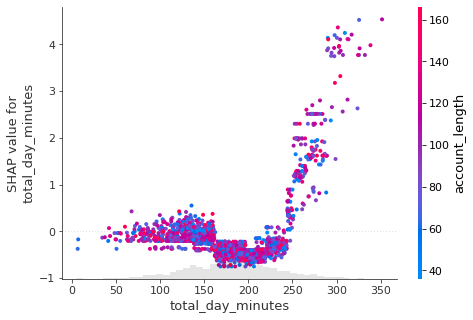

In [148]:
shap.plots.scatter(shap_values[:,"total_day_minutes"], color=shap_values[:,"account_length"])

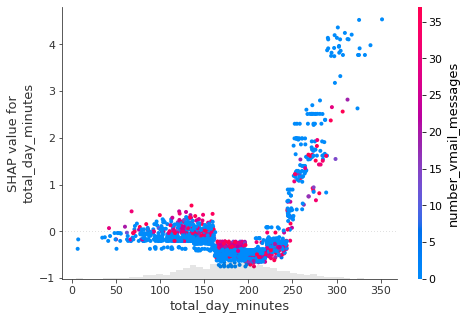

In [150]:
shap.plots.scatter(shap_values[:,"total_day_minutes"], color=shap_values)

In [154]:
import shap
from sklearn.ensemble import RandomForestClassifier
rforest = RandomForestClassifier(n_estimators=100, max_depth=3, min_samples_split=20, random_state=0)
rforest.fit(X, Y)


# explain all the predictions in the test set
explainer = shap.TreeExplainer(rforest)
shap_values = explainer.shap_values(X)


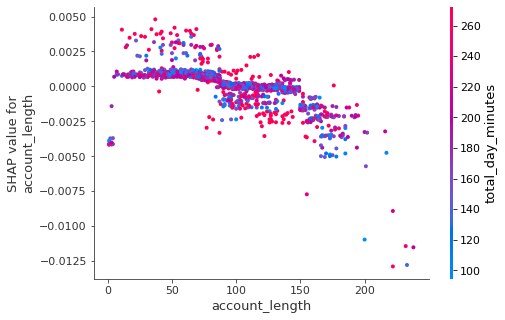

In [156]:
shap.dependence_plot("account_length", shap_values[0], X)

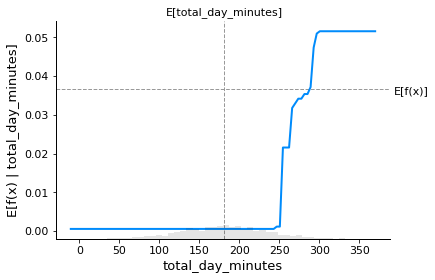

In [157]:
shap.partial_dependence_plot(
    "total_day_minutes", rforest.predict, X, ice=False,
    model_expected_value=True, feature_expected_value=True
)

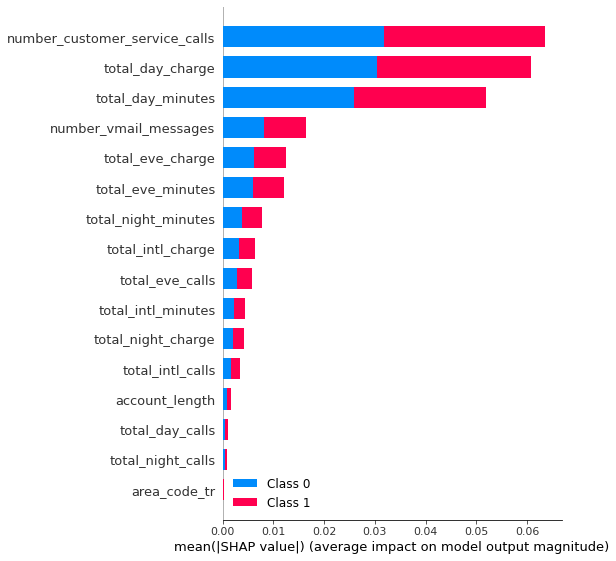

In [162]:
shap.summary_plot(shap_values, X)

In [163]:
X.head(3)

,account_length,number_vmail_messages,total_day_minutes,total_day_calls,total_day_charge,total_eve_minutes,total_eve_calls,total_eve_charge,total_night_minutes,total_night_calls,total_night_charge,total_intl_minutes,total_intl_calls,total_intl_charge,number_customer_service_calls,area_code_tr
0,101,0,70.9,123,12.05,211.9,73,18.01,236.0,73,10.62,10.6,3,2.86,3,2
1,137,0,223.6,86,38.01,244.8,139,20.81,94.2,81,4.24,9.5,7,2.57,0,2
2,103,29,294.7,95,50.10,237.3,105,20.17,300.3,127,13.51,13.7,6,3.70,1,0


In [165]:
model = CatBoostClassifier(iterations=10, learning_rate=0.1, random_seed=12)
model.fit(X, Y, verbose=True, plot=False)

0:	learn: 0.6381393	total: 10.2ms	remaining: 91.9ms
1:	learn: 0.5900921	total: 20.1ms	remaining: 80.2ms
2:	learn: 0.5517727	total: 29.9ms	remaining: 69.8ms
3:	learn: 0.5166202	total: 39.9ms	remaining: 59.9ms
4:	learn: 0.4872410	total: 49.9ms	remaining: 49.9ms
5:	learn: 0.4632012	total: 60.1ms	remaining: 40ms
6:	learn: 0.4414588	total: 69.8ms	remaining: 29.9ms
7:	learn: 0.4222780	total: 79.6ms	remaining: 19.9ms
8:	learn: 0.4073681	total: 89.5ms	remaining: 9.95ms
9:	learn: 0.3915051	total: 99.5ms	remaining: 0us


In [167]:
explainer = shap.TreeExplainer(model)
shap_values = explainer.shap_values(Pool(X, Y))


In [168]:
shap.force_plot(explainer.expected_value, shap_values[0,:], X.iloc[0,:])

In [169]:
shap.force_plot(explainer.expected_value, shap_values[91,:], X.iloc[91,:])

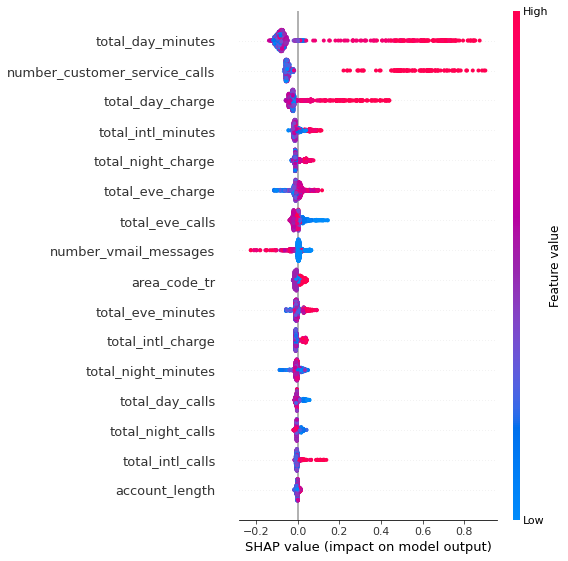

In [170]:
shap.summary_plot(shap_values, X)

In [174]:
import lime
import lime.lime_tabular

explainer = lime.lime_tabular.LimeTabularExplainer(np.array(xtrain),
                    feature_names=list(xtrain.columns), 
                    class_names=['target_churn_dum'], 
                    verbose=True, mode='classification')

In [176]:
# this record is a no churn scenario
exp = explainer.explain_instance(X.iloc[0], model.predict_proba, num_features=16)
exp.as_list()

Intercept 0.2758028503306529
Prediction_local [0.34562036]
Right: 0.23860629814459952


[('number_customer_service_calls > 2.00', 0.06944779279619419),
 ('total_day_minutes <= 144.10', -0.026032556397868205),
 ('area_code_tr > 1.00', 0.012192087473855579),
 ('total_day_charge <= 24.50', -0.01049348495191592),
 ('total_night_charge > 10.57', 0.009208937152255816),
 ('total_eve_calls <= 88.00', 0.007763649795450518),
 ('17.12 < total_eve_charge <= 19.74', 0.006648493070415344),
 ('number_vmail_messages <= 0.00', 0.0054214568436186375),
 ('98.00 < account_length <= 126.00', 0.004192090777110732),
 ('2.81 < total_intl_charge <= 3.21', -0.004030006982470514),
 ('201.40 < total_eve_minutes <= 232.20', -0.0039743556975642405),
 ('total_night_minutes > 234.80', 0.0035628982403953778),
 ('total_night_calls <= 86.00', 0.0029612465055136334),
 ('total_day_calls > 112.00', -0.0028523783898236925),
 ('total_intl_calls <= 3.00', -0.002506612124522332),
 ('10.40 < total_intl_minutes <= 11.90', -0.0016917444417898933)]

In [177]:
pd.DataFrame(exp.as_list())

,0,1
0,number_customer_service_calls > 2.00,0.069448
1,total_day_minutes <= 144.10,-0.026033
2,area_code_tr > 1.00,0.012192
3,total_day_charge <= 24.50,-0.010493
4,total_night_charge > 10.57,0.009209
5,total_eve_calls <= 88.00,0.007764
6,17.12 < total_eve_charge <= 19.74,0.006648
7,number_vmail_messages <= 0.00,0.005421
8,98.00 < account_length <= 126.00,0.004192
9,2.81 < total_intl_charge <= 3.21,-0.004030


In [178]:
exp.show_in_notebook(show_table=True)

In [179]:
# This is s churn scenario
exp = explainer.explain_instance(X.iloc[20], model.predict_proba, num_features=16)
exp.as_list()

Intercept 0.32979383442829424
Prediction_local [0.22940692]
Right: 0.25256892775050466


[('number_customer_service_calls <= 1.00', -0.03195279452926141),
 ('144.10 < total_day_minutes <= 181.00', -0.03105192670898253),
 ('total_intl_charge > 3.21', 0.010519683979779627),
 ('101.00 < total_eve_calls <= 114.00', -0.008871850152517477),
 ('0.00 < area_code_tr <= 1.00', -0.008355187259945206),
 ('total_intl_minutes > 11.90', 0.007391379556830906),
 ('24.50 < total_day_charge <= 30.77', -0.006975112181235882),
 ('total_night_charge <= 7.56', -0.006500647887830215),
 ('total_eve_charge <= 14.14', -0.006278552413626889),
 ('number_vmail_messages > 0.00', -0.0062185929677679875),
 ('total_night_minutes <= 167.90', -0.003079244107811434),
 ('4.00 < total_intl_calls <= 5.00', -0.0026984920221149998),
 ('total_day_calls > 112.00', -0.0024708590253414045),
 ('total_eve_minutes <= 166.40', -0.002156339757484174),
 ('98.00 < account_length <= 126.00', -0.0013292154399683106),
 ('86.00 < total_night_calls <= 99.00', -0.00035916152353229)]

In [180]:
exp.show_in_notebook(show_table=True)

In [182]:
eli5.show_weights(model,
                 feature_names=list(X.columns))

Weight,Feature
0.3703,total_day_minutes
0.2426,number_customer_service_calls
0.1181,total_day_charge
0.0466,total_eve_charge
0.0427,number_vmail_messages
0.0305,total_eve_minutes
0.0264,total_eve_calls
0.0258,total_intl_minutes
0.0190,total_night_minutes
0.0180,total_night_charge


In [183]:
eli5.explain_weights(model, feature_names=list(X.columns))

Weight,Feature
0.3703,total_day_minutes
0.2426,number_customer_service_calls
0.1181,total_day_charge
0.0466,total_eve_charge
0.0427,number_vmail_messages
0.0305,total_eve_minutes
0.0264,total_eve_calls
0.0258,total_intl_minutes
0.0190,total_night_minutes
0.0180,total_night_charge


In [184]:
eli5.explain_prediction(model,X.iloc[60])

Explanation(estimator='<catboost.core.CatBoostClassifier object at 0x7fce0dc4bad0>', description=None, error='estimator <catboost.core.CatBoostClassifier object at 0x7fce0dc4bad0> is not supported', method=None, is_regression=False, targets=None, feature_importances=None, decision_tree=None, highlight_spaces=None, transition_features=None, image=None)

In [185]:
from eli5.sklearn import PermutationImportance

In [186]:
perm = PermutationImportance(model)
perm.fit(X, Y)
eli5.show_weights(perm,feature_names=list(X.columns))

Weight,Feature
0.0352 ± 0.0051,total_day_minutes
0.0250 ± 0.0006,total_day_charge
0.0121 ± 0.0024,number_vmail_messages
0.0110 ± 0.0051,total_eve_charge
0.0052 ± 0.0048,total_night_minutes
0.0028 ± 0.0025,total_night_charge
0.0023 ± 0.0009,total_eve_calls
0.0022 ± 0.0012,number_customer_service_calls
0.0022 ± 0.0018,total_eve_minutes
0.0019 ± 0.0012,total_night_calls


In [187]:
import pandas as pd
df_red = pd.read_csv('https://archive.ics.uci.edu/ml/machine-learning-databases/wine-quality/winequality-red.csv',sep=';')
df_white = pd.read_csv('https://archive.ics.uci.edu/ml/machine-learning-databases/wine-quality/winequality-white.csv',sep=';')

In [188]:
features = ['fixed_acidity','volatile_acidity','citric_acid','residual_sugar',
            'chlorides','free_sulfur_dioxide','total_sulfur_dioxide','density',
            'pH','sulphates','alcohol','quality']

In [189]:
df = pd.concat([df_red,df_white],axis=0)
df.columns = features
df.quality = pd.Categorical(df.quality)
df.head()

,fixed_acidity,volatile_acidity,citric_acid,residual_sugar,chlorides,free_sulfur_dioxide,total_sulfur_dioxide,density,pH,sulphates,alcohol,quality
0,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4,5
1,7.8,0.88,0.00,2.6,0.098,25.0,67.0,0.9968,3.20,0.68,9.8,5
2,7.8,0.76,0.04,2.3,0.092,15.0,54.0,0.9970,3.26,0.65,9.8,5
3,11.2,0.28,0.56,1.9,0.075,17.0,60.0,0.9980,3.16,0.58,9.8,6
4,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4,5


In [190]:
y = df.pop('quality')
X = df

In [191]:
import catboost
from catboost import *
import shap
shap.initjs()

In [192]:
model = CatBoostClassifier(loss_function = 'MultiClass', 
                           iterations=300, 
                           learning_rate=0.1, 
                           random_seed=123)
model.fit(X, y, verbose=False, plot=False)

In [193]:
explainer = shap.TreeExplainer(model)
shap_values = explainer.shap_values(Pool(X, y))

In [194]:
set(y)

{3, 4, 5, 6, 7, 8, 9}

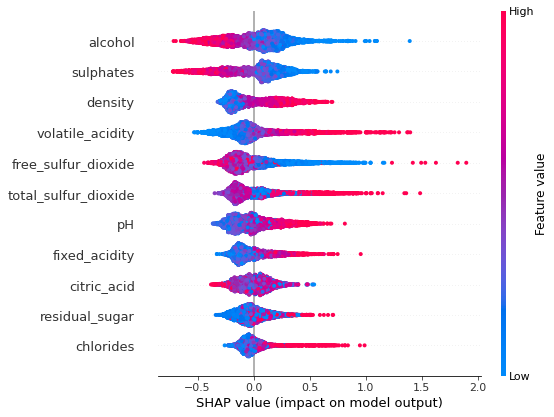

In [195]:
shap.summary_plot(shap_values[0], X)

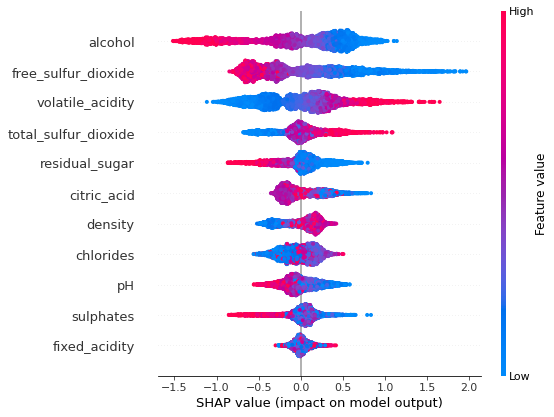

In [196]:
shap.summary_plot(shap_values[1], X)

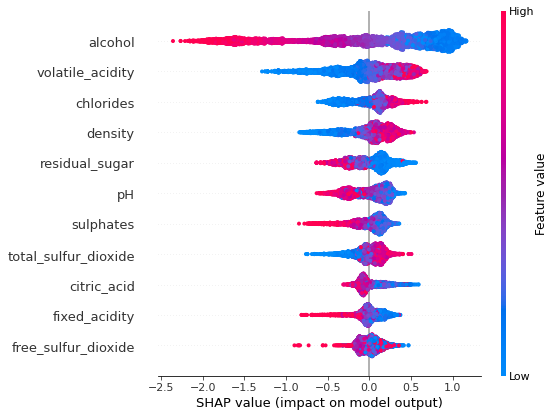

In [197]:
shap.summary_plot(shap_values[2], X)